<a href="https://colab.research.google.com/github/GiharaNavindu/LemonClass/blob/main/Lemon_Quality_Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 19.4 MB/s eta 0:00:00


In [ ]:
pip install scikit-learn

In [ ]:
!pip install pandas==1.3.5



In [ ]:
import mahotas as mh
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

#Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay


In [ ]:
print(pd.__version__)

1.3.5


In [ ]:
pip install skillsnetwork

IN this dataset we have train images ,test images and 2 csv files for trian ,test datasets.

In [ ]:
import skillsnetwork

await skillsnetwork.prepare("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0UEREN/hiroshima-lemon.zip", overwrite=True)

  0%|          | 0/5515 [00:00<?, ?it/s]

Saved to '.'


In [ ]:


def get_data(folder, file): #  2 parameters. file containing the folder and the bse name of the file.
    plt.rcParams["axes.grid"] = False
    images = [] # empty list for images
    labels = [] # empty list for labels

    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')  # Form a pandas dataframe from a csv
    print(ds)

#ds contains rows corresponding to each entry in CSV(row has 2 values-im and c)
    i = 0
    r = 0
    for im, c in ds.values: #Iterates over the rows of the numpy array,unpacking each row into im(image filename) and c(label)
        if i == 0 and r < 50:
            fig = plt.figure(figsize=(20, 20))  # Display an image
        image = mh.imread(folder + '/' + file + '/' + im)  # Download an image
        images.append(image)  # Append image to the list
        labels.append(c)  # Append label to the list

        if r < 50:
            plt.subplot(1, 5, i + 1)  # Create a table of images
            plt.imshow(image)
        i += 1
        if i == 5:
            i = 0
        r += 1

    plt.show()

    return images, labels  # Return separate lists for images and labels



hiroshima-lemon/train_images
                  id  class_num
0     train_0000.jpg          0
1     train_0001.jpg          0
2     train_0002.jpg          0
3     train_0003.jpg          0
4     train_0004.jpg          0
...              ...        ...
1097  train_1097.jpg          1
1098  train_1098.jpg          0
1099  train_1099.jpg          1
1100  train_1100.jpg          2
1101  train_1101.jpg          0

[1102 rows x 2 columns]


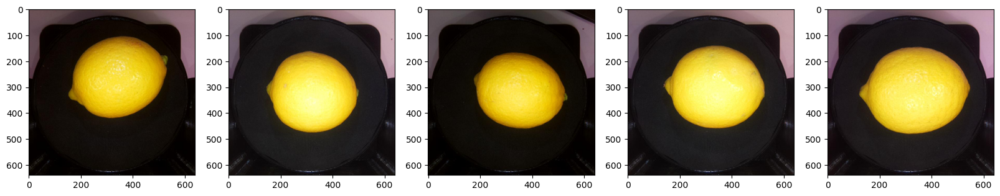

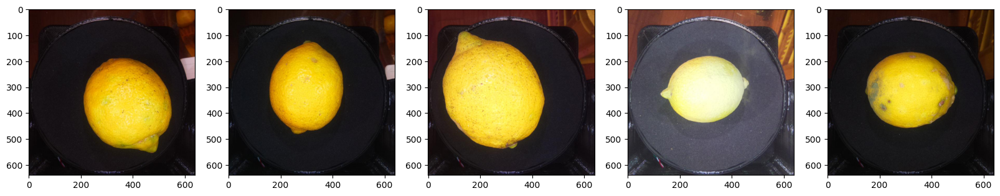

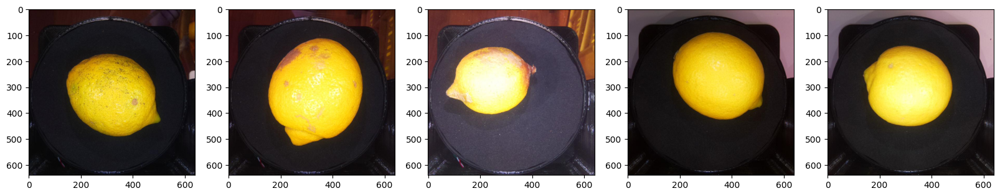

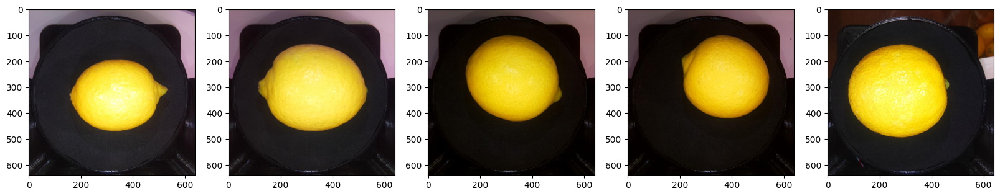

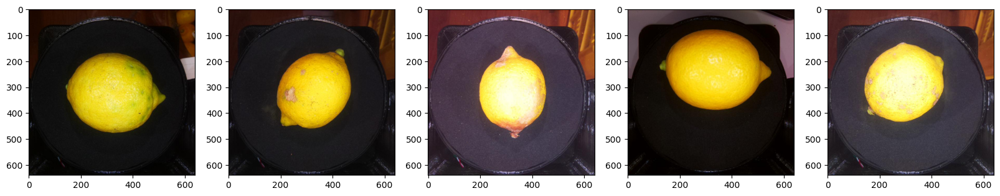

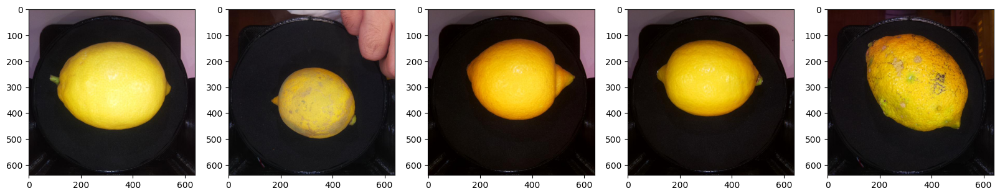

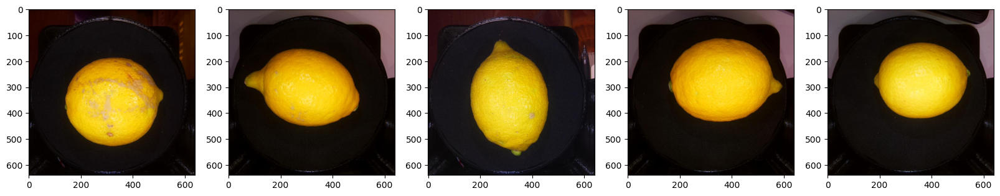

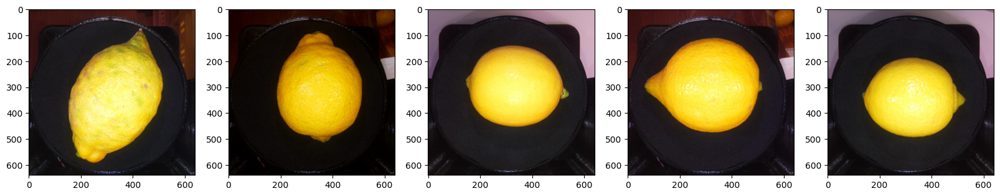

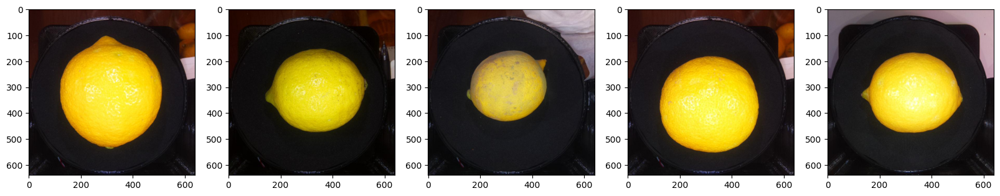

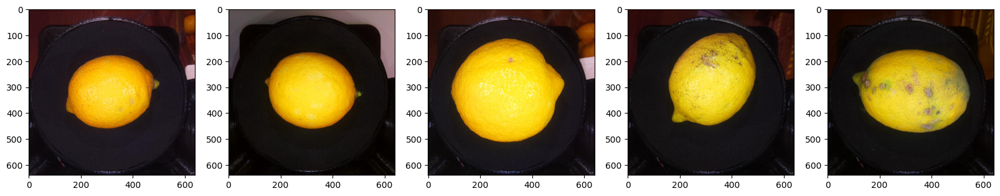

In [ ]:
# Example usage
d = "hiroshima-lemon"
f = "train_images"
images, labels = get_data(d, f)

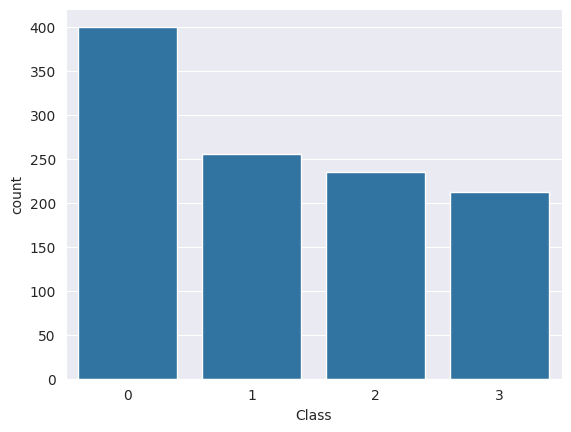

In [ ]:

# Convert labels to a DataFrame
c = pd.DataFrame(labels, columns=['Class'])

# Set the style for the plot
sns.set_style('darkgrid')

# Create the count plot
sns.countplot(x="Class", data=c)
plt.show()

In [ ]:
class_names = {0: 'excellent', 1: 'good', 2: 'processed products', 3: 'disqualified'}

hiroshima-lemon/train_images
                  id  class_num
0     train_0000.jpg          0
1     train_0001.jpg          0
2     train_0002.jpg          0
3     train_0003.jpg          0
4     train_0004.jpg          0
...              ...        ...
1097  train_1097.jpg          1
1098  train_1098.jpg          0
1099  train_1099.jpg          1
1100  train_1100.jpg          2
1101  train_1101.jpg          0

[1102 rows x 2 columns]


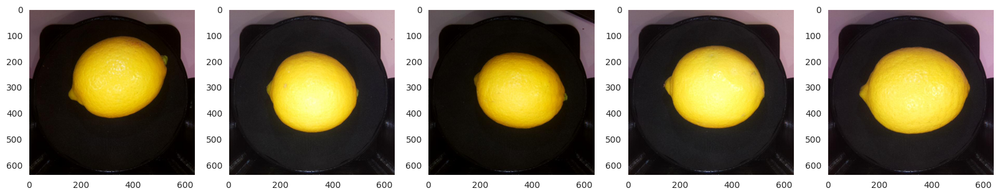

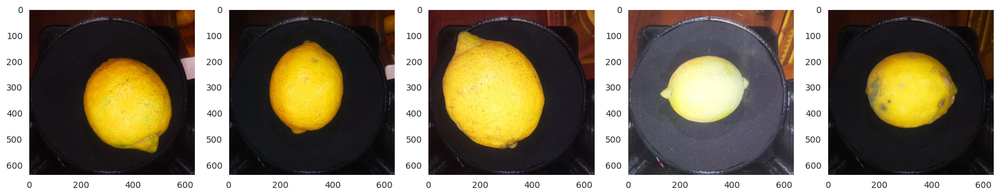

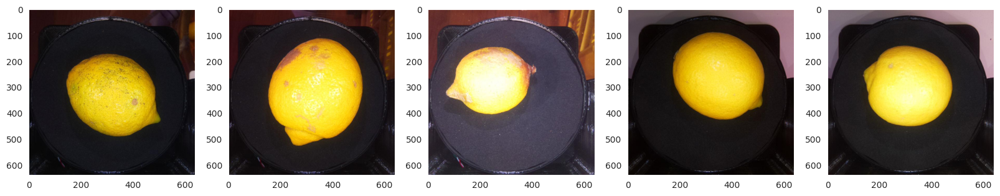

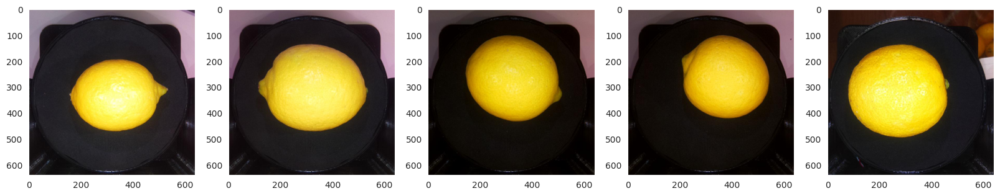

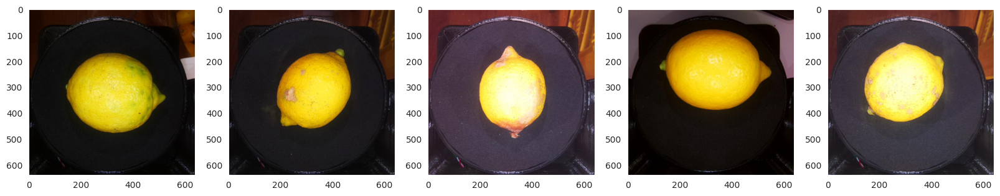

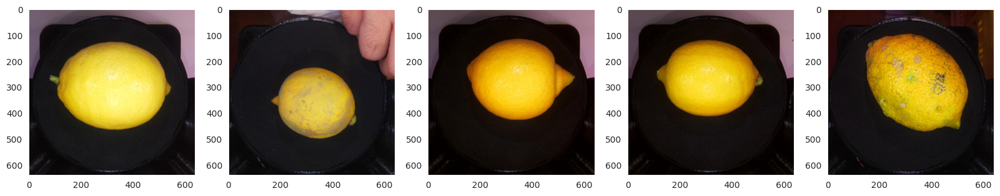

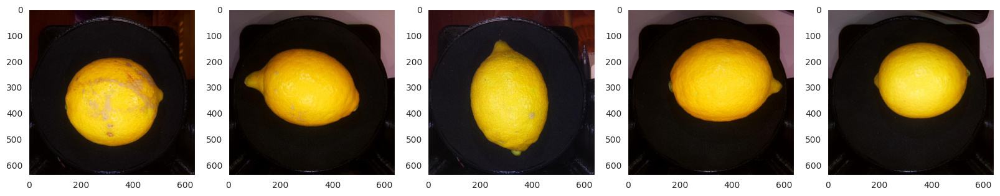

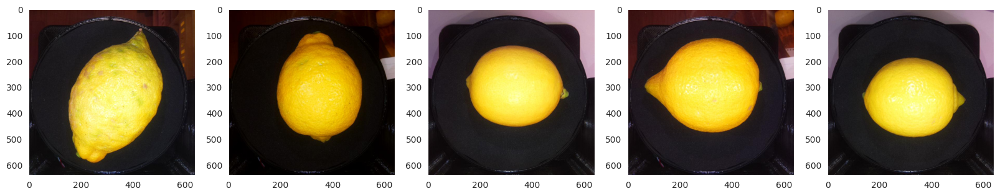

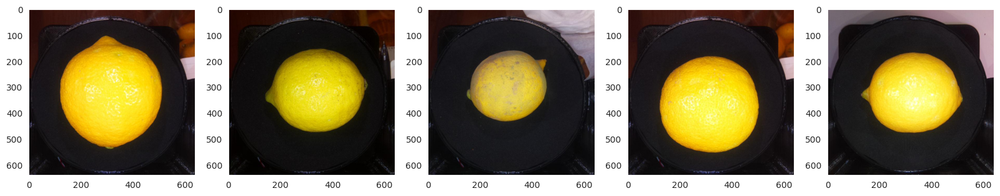

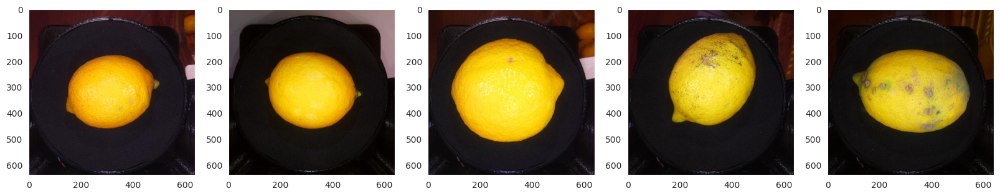

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming `images` and `labels` are returned from `get_data`
images, labels = get_data(d, f)

# Split the dataset into training and validation sets
im_train, im_val, c_train, c_val = train_test_split(images, labels, test_size=0.3, shuffle=True)

# Convert labels to integers (if they are not already)
c_train = np.array(c_train).astype('int')
c_val = np.array(c_val).astype('int')

In [ ]:
# Print the number of images in the training and validation sets
print("Number of training images:", len(im_train))
print("Number of validation images:", len(im_val))

# Print the shape of the first image in the training and validation sets
if len(im_train) > 0:
    print("Shape of the first training image:", im_train[0].shape)
if len(im_val) > 0:
    print("Shape of the first validation image:", im_val[0].shape)

Number of training images: 771
Number of validation images: 331
Shape of the first training image: (640, 640, 3)
Shape of the first validation image: (640, 640, 3)


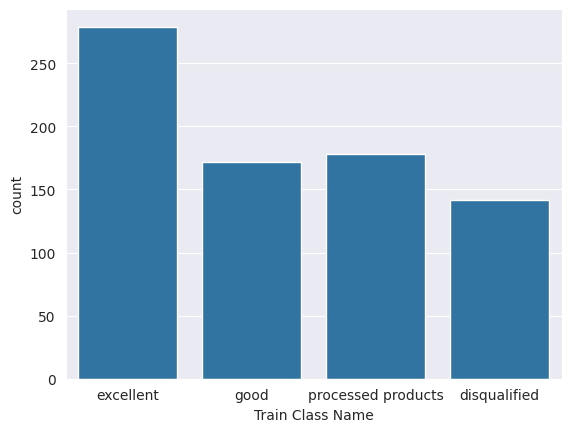

In [ ]:
c = pd.DataFrame(c_train, columns=['Train Class'])

# Map integer labels to class names
c['Train Class Name'] = c['Train Class'].map(class_names)

# Set the style for the plot
sns.set_style('darkgrid')

# Create the count plot
sns.countplot(x="Train Class Name", data=c, order=['excellent', 'good', 'processed products', 'disqualified'])
plt.show()

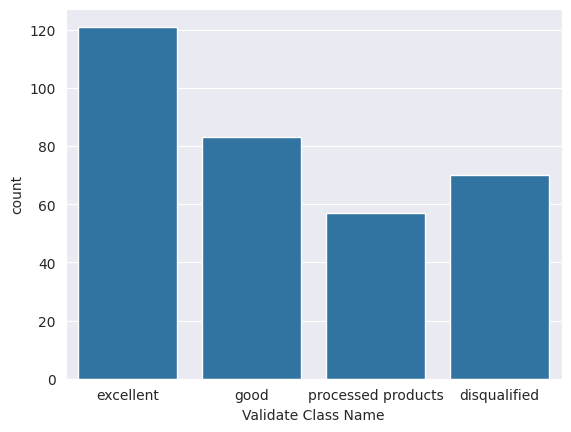

In [ ]:
c = pd.DataFrame(c_val, columns=['Validate Class'])

# Map integer labels to class names
c['Validate Class Name'] = c['Validate Class'].map(class_names)

# Set the style for the plot
sns.set_style('darkgrid')

# Create the count plot
sns.countplot(x="Validate Class Name", data=c, order=['excellent', 'good', 'processed products', 'disqualified'])
plt.show()

Quality of lemon
excellent


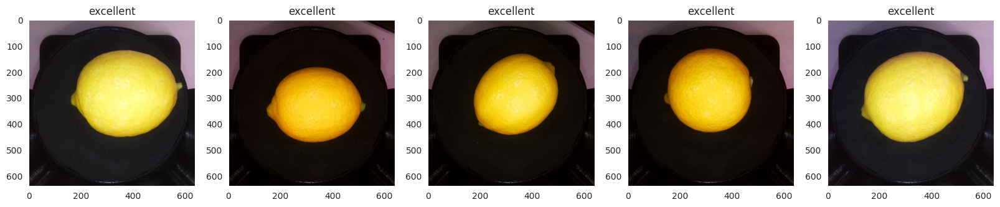

good


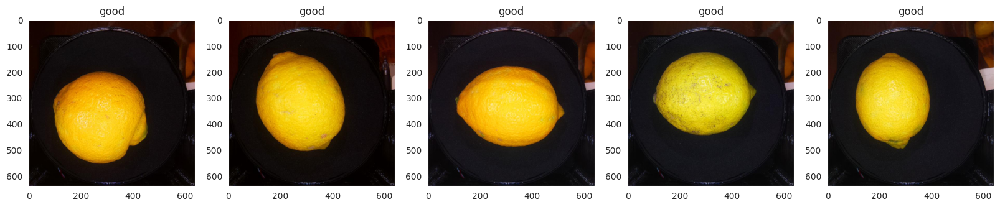

processed products


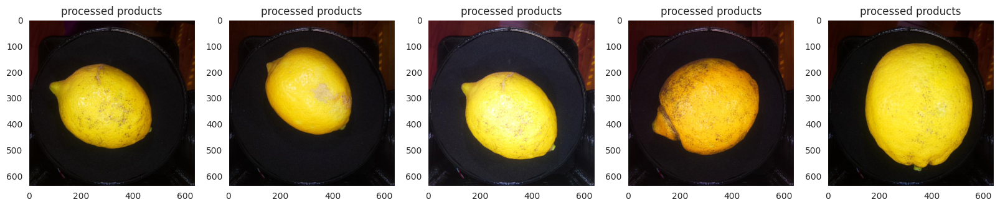

disqualified


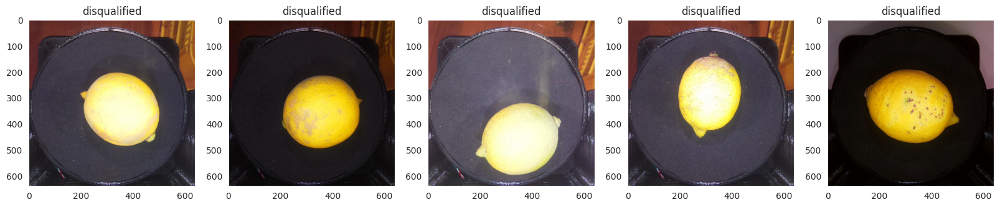

In [ ]:
print("Quality of lemon")
plt.rcParams["axes.grid"] = False

# Iterate through each class
for c in class_names:
    # Find the indices of the first 5 images for the current class
    ims = np.where(c_train == c)[0][:5]
    print(class_names[c])

    # Create a figure to display the images
    fig = plt.figure(figsize=(20, 20))

    # Display the first 5 images for the current class
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i + 1)  # Create a table of images
        plt.imshow(im_train[im])  # Display the image
        plt.title(class_names[c])  # Set the title to the class name

    plt.show()

In [ ]:
def create_features(im):
    features = []
    for image in im:
        # Convert the image to grayscale
        im_grey = mh.colors.rgb2grey(image, dtype=np.uint8)

        # Compute Haralick texture features and flatten them
        haralick_features = mh.features.haralick(im_grey).ravel()

        # Append the features to the list
        features.append(haralick_features)

    # Convert the list of features to a NumPy array
    features = np.array(features)
    return features

In [ ]:
features_train = create_features(im_train)
features_val = create_features(im_val)

In [ ]:
print(features_train.shape)
print(features_val.shape)

(771, 52)
(331, 52)


Training DataSet accuracy:  92.9%
Test DataSet accuracy:  93.1%


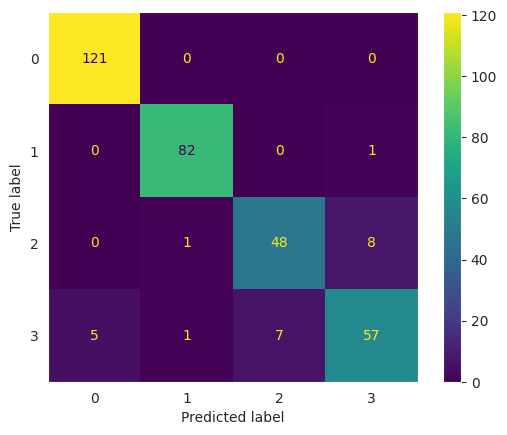

In [ ]:
# Create a pipeline with StandardScaler and LogisticRegression
clf = Pipeline([
    ('preproc', StandardScaler()),  # Standardize features
    ('classifier', LogisticRegression(max_iter=1000))  # Logistic Regression classifier
])

# Train the model on the training set
clf.fit(features_train, c_train)

# Evaluate the model on the training and validation sets
scores_train = clf.score(features_train, c_train)
scores_val = clf.score(features_val, c_val)

# Print the accuracy scores
print('Training DataSet accuracy: {: .1%}'.format(scores_train))
print('Test DataSet accuracy: {: .1%}'.format(scores_val))

# Display the confusion matrix for the validation set
ConfusionMatrixDisplay.from_estimator(clf, features_val, c_val)
plt.show()

In [ ]:
names = [
    "Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
    "Decision Tree", "Random Forest", "Neural Net", "AdaBoost", "Naive Bayes", "QDA"
]

classifiers = [
    LogisticRegression(max_iter=1000),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()
]

# Lists to store accuracy scores
scores_train = []
scores_val = []

# Iterate through each classifier
for name, clf in zip(names, classifiers):
    print("Fitting:", name)

    # Create a pipeline with StandardScaler and the current classifier
    clf = Pipeline([
        ('preproc', StandardScaler()),  # Standardize features
        ('classifier', clf)  # Current classifier
    ])

    # Train the model on the training set
    clf.fit(features_train, c_train)

    # Evaluate the model on the training and validation sets
    score_train = clf.score(features_train, c_train)
    score_val = clf.score(features_val, c_val)

    # Append the scores to the lists
    scores_train.append(score_train)
    scores_val.append(score_val)

    # Print the accuracy scores for the current classifier
    print(f"Training accuracy: {score_train:.1%}, Validation accuracy: {score_val:.1%}")

# Print the final results
results = pd.DataFrame({
    'Classifier': names,
    'Training Accuracy': scores_train,
    'Validation Accuracy': scores_val
})
print(results)

Fitting: Logistic Regression
Training accuracy: 92.9%, Validation accuracy: 93.1%
Fitting: Nearest Neighbors
Training accuracy: 92.5%, Validation accuracy: 86.7%
Fitting: Linear SVM
Training accuracy: 77.7%, Validation accuracy: 80.4%
Fitting: RBF SVM
Training accuracy: 99.9%, Validation accuracy: 82.8%
Fitting: Gaussian Process


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/_gpc.py:476: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-package

Training accuracy: 100.0%, Validation accuracy: 96.7%
Fitting: Decision Tree
Training accuracy: 81.2%, Validation accuracy: 80.7%
Fitting: Random Forest
Training accuracy: 82.2%, Validation accuracy: 79.5%
Fitting: Neural Net
Training accuracy: 96.2%, Validation accuracy: 93.4%
Fitting: AdaBoost
Training accuracy: 78.5%, Validation accuracy: 74.3%
Fitting: Naive Bayes
Training accuracy: 68.4%, Validation accuracy: 70.4%
Fitting: QDA
Training accuracy: 100.0%, Validation accuracy: 97.0%
             Classifier  Training Accuracy  Validation Accuracy
0   Logistic Regression           0.928664             0.930514
1     Nearest Neighbors           0.924773             0.867069
2            Linear SVM           0.776913             0.803625
3               RBF SVM           0.998703             0.827795
4      Gaussian Process           1.000000             0.966767
5         Decision Tree           0.811933             0.806647
6         Random Forest           0.822309             0.7945

/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 2 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 3 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


In [ ]:
res = pd.DataFrame(index=names)
res['scores_train'] = scores_train
res['scores_val'] = scores_val

# Rename columns and index for better readability
res.columns = ['Training Accuracy', 'Validation Accuracy']
res.index.name = "Classifier"

# Format the display to show 2 decimal places
pd.options.display.float_format = '{:,.2f}'.format

# Print the results
print(res)

                     Training Accuracy  Validation Accuracy
Classifier                                                 
Logistic Regression               0.93                 0.93
Nearest Neighbors                 0.92                 0.87
Linear SVM                        0.78                 0.80
RBF SVM                           1.00                 0.83
Gaussian Process                  1.00                 0.97
Decision Tree                     0.81                 0.81
Random Forest                     0.82                 0.79
Neural Net                        0.96                 0.93
AdaBoost                          0.78                 0.74
Naive Bayes                       0.68                 0.70
QDA                               1.00                 0.97


In [ ]:
def get_test_data(folder, file):
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')  # Read the CSV file
    for im in ds.values:
        image = mh.imread(folder + '/' + file + '/' + im[0])  # Load each image
        data.append(image)
    return np.array(data)  # Return images as a NumPy array

# Example usage
d = "hiroshima-lemon"
f = "test_images"
test = get_test_data(d, f)

hiroshima-lemon/test_images


In [ ]:
def create_features(im):
    features = []
    for image in im:
        im_grey = mh.colors.rgb2grey(image, dtype=np.uint8)  # Convert to grayscale
        haralick_features = mh.features.haralick(im_grey).ravel()  # Extract Haralick features
        features.append(haralick_features)
    return np.array(features)  # Return features as a NumPy array

# Extract features from the test images
features_test = create_features(test)
print("Test images shape:", test.shape)
print("Test features shape:", features_test.shape)

Test images shape: (1651, 640, 640, 3)
Test features shape: (1651, 52)


Predicted classes: [0 3 0 ... 2 0 0]
Classification results
excellent


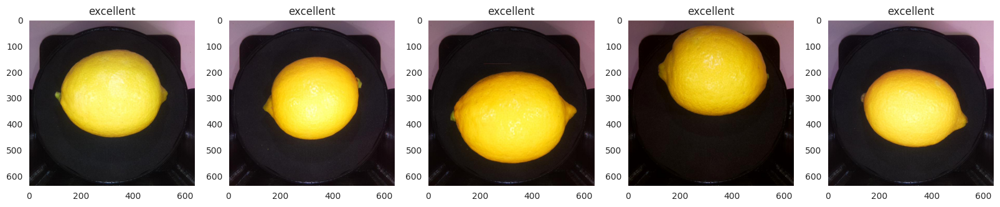

good


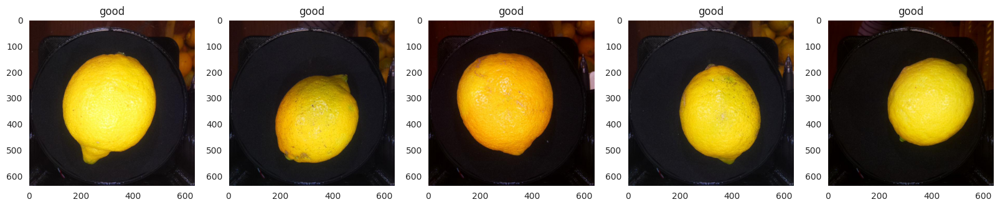

processed products


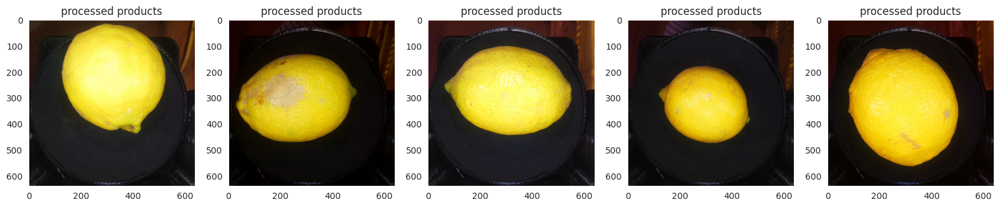

disqualified


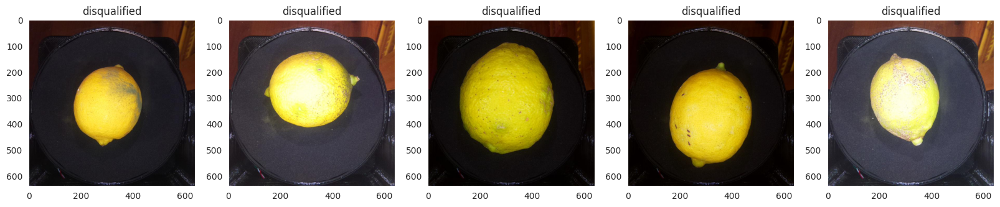

In [ ]:
# Define class names (update this based on your dataset)
class_names = {
    0: 'excellent',
    1: 'good',
    2: 'processed products',
    3: 'disqualified'
}

# Create a pipeline with StandardScaler and LogisticRegression
clf = Pipeline([
    ('preproc', StandardScaler()),  # Standardize features
    ('classifier', LogisticRegression(max_iter=1000))  # Logistic Regression classifier
])

# Train the model on the training set
clf.fit(features_train, c_train)

# Predict the classes of the test images
c_test = clf.predict(features_test)
print("Predicted classes:", c_test)

# Visualize the classification results
print("Classification results")
for c in class_names:
    ims = np.where(c_test == c)[0][:5]  # Get the first 5 images for each class
    print(class_names[c])
    fig = plt.figure(figsize=(20, 20))
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i + 1)  # Create a table of images
        plt.imshow(test[im])
        plt.title(class_names[c])
    plt.show()

Loading images from hiroshima-lemon/test_images
Test images shape: (1651, 640, 640, 3)
Test features shape: (1651, 52)
Predicted classes: [0 3 0 ... 2 0 0]
Classification results
excellent


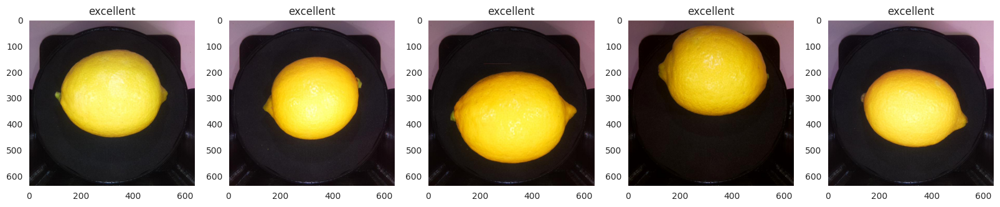

good


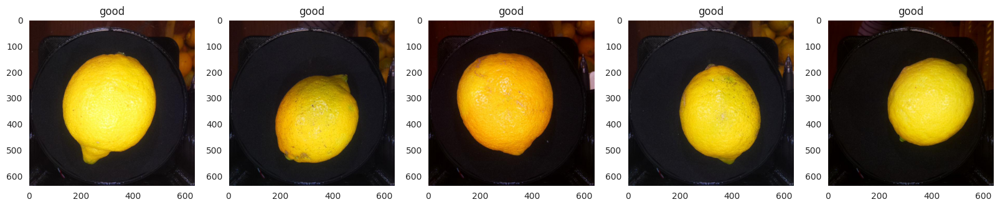

processed products


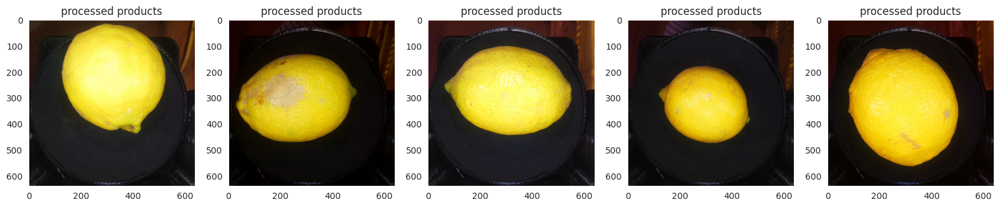

disqualified


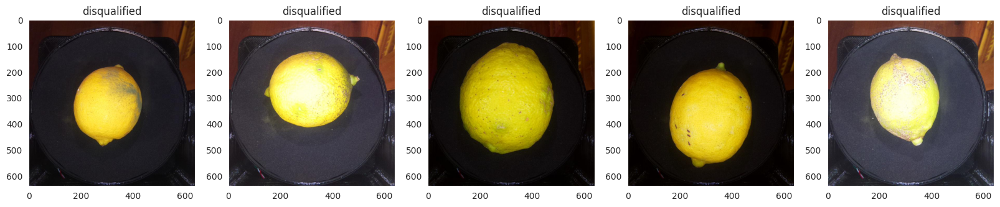

Generating report for hiroshima-lemon/test_images
Report saved to lemon_quality_report.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

                 id  Class          Class Name
0     test_0000.jpg      0           excellent
1     test_0001.jpg      3        disqualified
2     test_0002.jpg      0           excellent
3     test_0003.jpg      3        disqualified
4     test_0004.jpg      0           excellent
...             ...    ...                 ...
1646  test_1646.jpg      3        disqualified
1647  test_1647.jpg      2  processed products
1648  test_1648.jpg      2  processed products
1649  test_1649.jpg      0           excellent
1650  test_1650.jpg      0           excellent

[1651 rows x 3 columns]


In [ ]:


# Step 3: Make a classification
def classify_images(features_train, c_train, features_test, class_names):
    clf = Pipeline([
        ('preproc', StandardScaler()),  # Standardize features
        ('classifier', LogisticRegression(max_iter=1000))  # Logistic Regression classifier
    ])
    clf.fit(features_train, c_train)  # Train the model
    c_test = clf.predict(features_test)  # Predict the classes of the test images
    print("Predicted classes:", c_test)

    # Visualize the classification results
    print("Classification results")
    for c in class_names:
        ims = np.where(c_test == c)[0][:5]  # Get the first 5 images for each class
        print(class_names[c])
        fig = plt.figure(figsize=(20, 20))
        for i, im in enumerate(ims):
            plt.subplot(1, 5, i + 1)  # Create a table of images
            plt.imshow(test[im])
            plt.title(class_names[c])
        plt.show()
    return c_test

# Step 4: Save the results in a file and download it
def generate_report(folder, file, res, class_names):
    print(f"Generating report for {folder}/{file}")
    ds = pd.read_csv(folder + '/' + file + '.csv')  # Read the original CSV file

    # Map numeric classes to class names
    ds['Class'] = res
    ds['Class Name'] = ds['Class'].map(class_names)

    # Save the results to a CSV file
    output_file = 'lemon_quality_report.csv'
    ds.to_csv(output_file, index=False)
    print(f"Report saved to {output_file}")

    # Provide a download link (for Google Colab)
    files.download(output_file)  # Download the file
    return ds

# Example usage
d = "hiroshima-lemon"
f = "test_images"

# Step 1: Download the test images
test = get_test_data(d, f)

# Step 2: Create features for the test images
features_test = create_features(test)
print("Test images shape:", test.shape)
print("Test features shape:", features_test.shape)

# Step 3: Classify the test images
class_names = {
    0: 'excellent',
    1: 'good',
    2: 'processed products',
    3: 'disqualified'
}
c_test = classify_images(features_train, c_train, features_test, class_names)

# Step 4: Generate the report and download it
report = generate_report(d, f, c_test, class_names)
print(report)  # Display the report in the console

The Lemon Quality Classification Report provides a comprehensive workflow for classifying lemon images into quality categories (e.g., excellent, good, processed products, disqualified) using machine learning. The process involves:

Loading and Preprocessing Images:

Test images are loaded from a specified folder and CSV file.

Each image is converted to grayscale, and Haralick texture features are extracted to create a feature dataset.

Training a Classifier:

A logistic regression model is trained on the training dataset (features_train, c_train).

The model is used to predict the quality classes of the test images.

Generating the Report:

The predicted classes are mapped to their corresponding class names (e.g., 0 → excellent).

A CSV file (lemon_quality_report.csv) is generated, containing the image names, numeric class labels, and class names.

Visualizing Results:

A grid of images is displayed for each class, showing the first 5 images classified as excellent, good, processed products, or disqualified.

Downloading the Report:

The CSV file is saved and made available for download, allowing users to analyze the results further.

Process Explanation
1. Download the Test Images
The get_test_data function reads a CSV file containing the names of the test images and loads the images from the specified folder.

The images are stored in a NumPy array for further processing.

2. Create Features
The create_features function converts each image to grayscale and extracts Haralick texture features.

Haralick features are statistical measures of texture that describe the relationships between pixel intensities in an image.

The features are flattened into a 1D array and stored in a NumPy array.

3. Classify the Images
A logistic regression model is trained on the training dataset (features_train, c_train).

The trained model is used to predict the quality classes of the test images (features_test).

The predicted classes are stored in c_test.

4. Generate the Report
The generate_report function:

Reads the original CSV file containing the test image names.

Adds two new columns: Class (numeric class labels) and Class Name (mapped class names).

Saves the results to a CSV file named lemon_quality_report.csv.

5. Visualize the Results
For each class, the first 5 images are displayed in a grid.

The title of each image indicates its predicted class (e.g., excellent, good).

6. Download the Report
The CSV file is saved and made available for download using the files.download function (in Google Colab).